Постройте график.  
Назовите график.  
Сделайте именование оси x и оси y.  
Сделайте выводы.  

### Задача 1
#### 1.1
Данные из прошлого дз

In [115]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
doma = pd.read_csv('kc_house_data.csv')
doma.head(5)

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,...,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
0,7129300520,20141013T000000,221900.0,3,1.00,1180,5650,1.0,0,0,...,7,1180,0,1955,0,98178,47.5112,-122.257,1340,5650
1,6414100192,20141209T000000,538000.0,3,2.25,2570,7242,2.0,0,0,...,7,2170,400,1951,1991,98125,47.7210,-122.319,1690,7639
2,5631500400,20150225T000000,180000.0,2,1.00,770,10000,1.0,0,0,...,6,770,0,1933,0,98028,47.7379,-122.233,2720,8062
3,2487200875,20141209T000000,604000.0,4,3.00,1960,5000,1.0,0,0,...,7,1050,910,1965,0,98136,47.5208,-122.393,1360,5000
4,1954400510,20150218T000000,510000.0,3,2.00,1680,8080,1.0,0,0,...,8,1680,0,1987,0,98074,47.6168,-122.045,1800,7503


#### 1.2
Изучите стоимости недвижимости

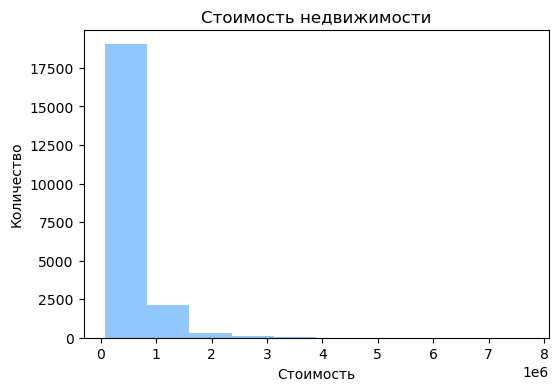

In [116]:
plt.figure(figsize=(6, 4))
plt.hist(doma['price'])
plt.xlabel('Стоимость')
plt.ylabel('Количество')
plt.title('Стоимость недвижимости');

#### 1.3
Изучите распределение квадратуры жилой

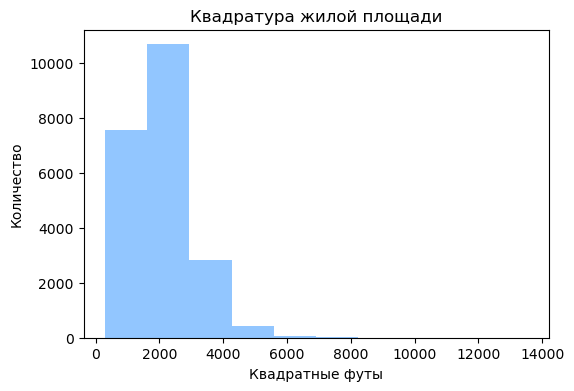

In [117]:
plt.figure(figsize=(6, 4))
plt.hist(doma['sqft_living'])
plt.xlabel('Квадратные футы')
plt.ylabel('Количество')
plt.title('Квадратура жилой площади');

#### 1.4
Изучите распределение года постройки

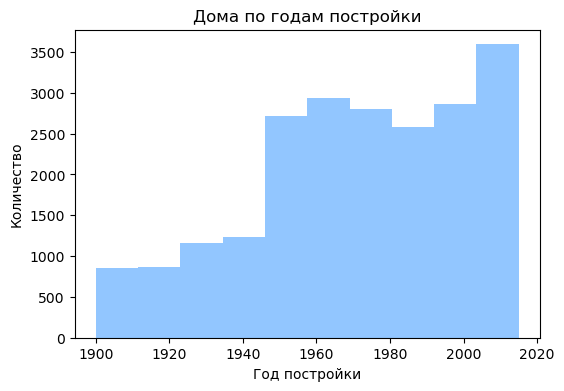

In [118]:
plt.figure(figsize=(6, 4))
plt.hist(doma['yr_built'])
plt.xlabel('Год постройки')
plt.ylabel('Количество')
plt.title('Дома по годам постройки');

### Задача 2
#### 2.1
Изучите распределение домов от наличия вида на набережную.  
Постройте график.  
Сделайте выводы.

In [119]:
doma1 = doma
doma1.replace({'waterfront' : { 0 : 'Нет', 1 : 'Да'}}, inplace= True)
data = doma1['waterfront'].value_counts()
labels = doma1['waterfront'].unique()
data

Нет    21450
Да       163
Name: waterfront, dtype: int64

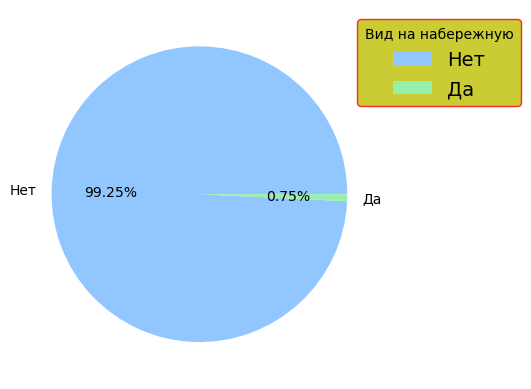

In [120]:
plt.pie(data.values, labels=labels, autopct='%1.2f%%')
plt.legend(fontsize=14, shadow=False, bbox_to_anchor=(0.9, 1), facecolor='y', edgecolor='r', title='Вид на набережную');

#### Вывод:
Основная маса домов (более 99%) не имеют вида на набережную.

#### 2.2
Изучите распределение этажей домов

In [121]:
data = doma['floors'].value_counts()
val = len(doma['floors'].unique ())

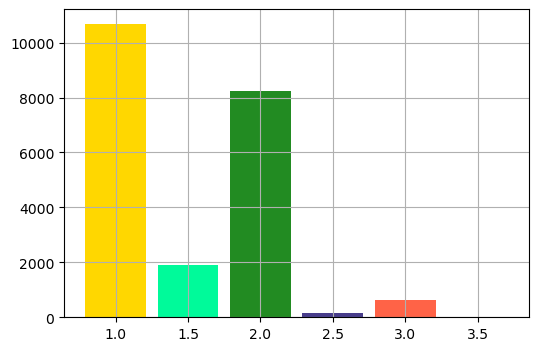

In [122]:
width = val*0.07
c = ['gold', 'forestgreen', 'mediumspringgreen', 'tomato', 'darkslateblue', 'palegoldenrod']

plt.figure(figsize=(6,4), dpi= 100)
plt.bar(data.index, data.values, color=c, width=width)
plt.grid();

#### 2.3
Изучите распределение состояния домов

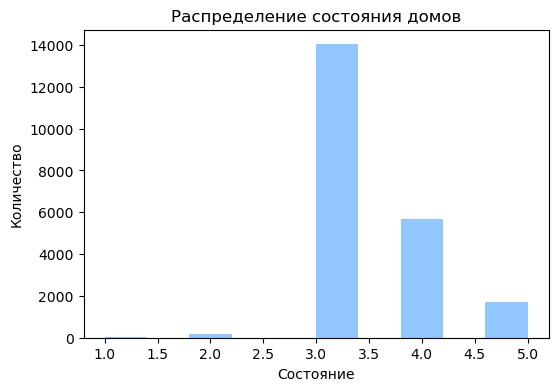

In [123]:
plt.figure(figsize=(6, 4))
plt.hist(doma['condition'])
plt.xlabel('Состояние')
plt.ylabel('Количество')
plt.title('Распределение состояния домов');

### Задача 3
Исследуйте, какие характеристики недвижимости влияют на стоимость недвижимости, с применением не менее 5 диаграмм из урока.  
Анализ сделайте в формате storytelling: дополнить каждый график письменными выводами и наблюдениями.
### Решение
Рассмотрим датасет домов и проанализируем следующие параметры:

* площадь дома;
* цена;
* число этажей;
* общий рейтинг дома.  

Нарисуем гистограммы (и одну круговую диаграмму по количеству этажей) их распределения:

Для начала определим выбросы по каждому из набора данных (что лежат за пределами "усов"):

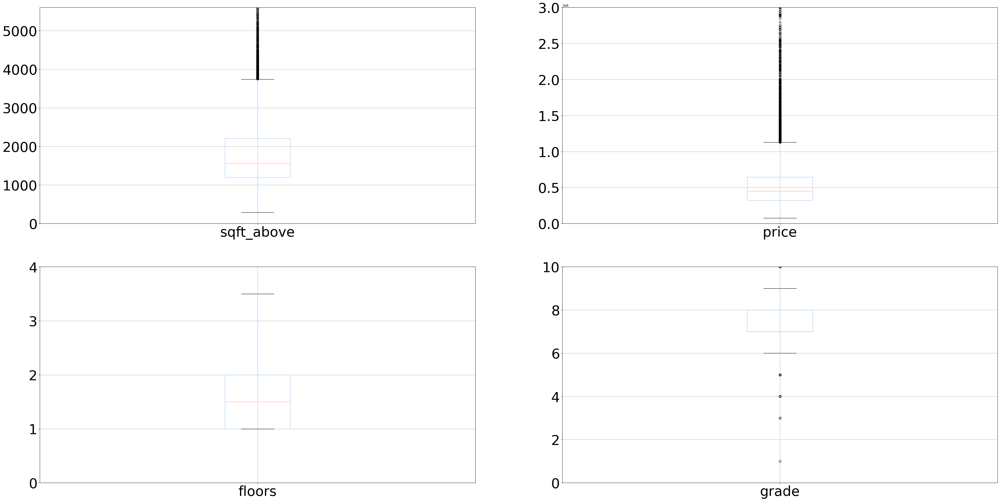

In [124]:
rows = 2
cols = 2
fig, axes = plt.subplots(rows, cols, figsize=(50,25))
column_list = ['sqft_above', 'price', 'floors', 'grade']
ylims = [5600, 3000000, 4, 10 ]
count = 0
for r in range(rows):
    for c in range(cols):
        ax = doma.boxplot(column=column_list[count], ax=axes[r,c], fontsize=40)
        ax.set_ylim([0, ylims[count]])
        count += 1

Определяем границы:

* sqft_above - 3800 кв.фута.;
* price - 1,2 млн.;
* floors - 4 этажа;
* grade - 9.

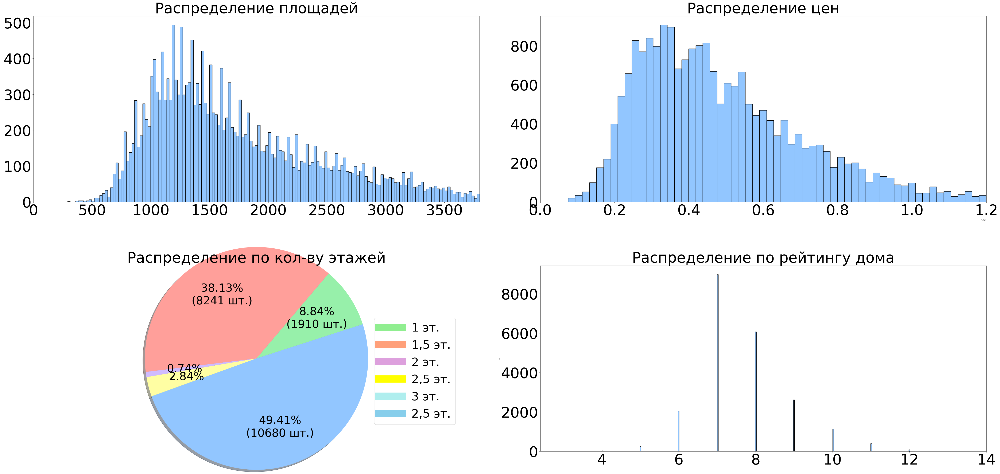

In [125]:
from matplotlib.lines import Line2D

plt.style.use('seaborn-pastel')

# отдельно создадим сводную таблицу для круговой диаграммы
doma_pivot = doma.pivot_table(index='floors', values='price', aggfunc='count')

df_list = [doma['sqft_above'], doma['price'], 
           doma['floors'], doma['grade']]
df_titles_list = ['Распределение площадей', 'Распределение цен', 
                  'Распределение по кол-ву этажей', 'Распределение по рейтингу дома']
#  Используем те значения, которые получили при исследовании ящиков с усами выше
xlims_list = [3800, 1200000, 4, 14]

# функция для отображения процентов на круговой диаграмме
def func_pct(pct, data, sum_of_all):
    value = float(pct/100.*sum_of_all)
    if value > 650:
        return "{:.2f}%\n({:.0f} шт.)".format(pct, value)
    elif value > 100:
        return "{:.2f}%".format(pct)
    else:
        return ''

ncol = 2
nrow = 2
fig, axes = plt.subplots(nrows=nrow, ncols=ncol, figsize=(50,25))
count = 0
for r in range(nrow):
    for c in range(ncol):
        if df_titles_list[count] == 'Распределение по кол-ву этажей':
            data_for_pct = doma_pivot
            sum_filt_aparts = doma_pivot.sum()
            ax = doma_pivot.plot(kind='pie', y="price", 
                                                            radius=1.5, shadow=True, startangle=200, fontsize=38,
                                                            autopct = lambda pct: func_pct(pct,data_for_pct,sum_filt_aparts),
                                                            title=df_titles_list[count], legend=True, labels=None,
                                                            pctdistance=0.65, labeldistance=0.5, ax=axes[r,c])
            custom_lines = [Line2D([0], [0], color='lightgreen', lw=25),
                            Line2D([0], [0], color='lightsalmon', lw=25),
                            Line2D([0], [0], color='plum', lw=25),
                            Line2D([0], [0], color='yellow', lw=25),
                            Line2D([0], [0], color='paleturquoise', lw=25),
                            Line2D([0], [0], color='skyblue', lw=25)]
            ax.title.set_size(50)
            ax.title.set_position([0.5, 1.15])
            ax.set_ylabel('')
            ax.legend(custom_lines, ['1 эт.', '1,5 эт.', '2 эт.', '2,5 эт.', '3 эт.', '2,5 эт.'], 
                      bbox_to_anchor=(1.1,0.75), prop={'size':40})
            plt.tight_layout(pad=10)
        else:
            ax = df_list[count].plot(kind='hist', bins=400, fontsize=50, title=df_titles_list[count], 
                                     ec='black', ax=axes[r,c])
            if count == 3:
                ax.set_xlim(2.4, xlims_list[count])
                ax.title.set_position([0.5, 2.15])
            else:
                ax.set_xlim(0, xlims_list[count])
            ax.title.set_size(50)
            ax.yaxis.label.set_size(0)
        count += 1


1. Гистограмма "Распределение площадей": Большая часть домов имеет метраж от 1000 до 1500 кв.фт., пик один - 1200 кв.фт.
2. Гистограмма "Распределение цен": цена на дома лежит, в основном, в промежутке от 0,2 до 1 млн. Большая часть домов продается за цену в промежутке между 0,25 и 0,7 млн.
3. Круговая диаграмма "Распределение по количеству этажей": Больше всего 1,5 и 2,5-этажных домов. На диаграмме нет 3-х этажных домов. А 2-х этажные составляют всего 0,74% от общего количества.
4. Гистограмма "Распределение по рейтингу по шкале оценок": основная масса домов имеет рейтинг 7, что означает "Средняя оценка конструкции и дизайна. Это обычно наблюдается в довольно старых домах.". Около 6000 домов имеют рейтинг, равный 8, что соответвсвует оценке "Чуть выше среднего по конструкции и дизайну. В домах такого качества обычно использовались более качественные материалы как для внешней, так и для внутренней отделки." В нашем датасете очень маленькая доля домов с высококачественными характеристиками (рейтинг 10), с индивидуальным дизайном (рейтинг 11, 12) и домов, спроектированных по индивидуальным проектам (рейтинг 13). 
Продолжим анализ с помощью тепловой карты: воспользуемся функцией *corr()* и посмотрим, как влияют определенные параметры дома на его стоимость.

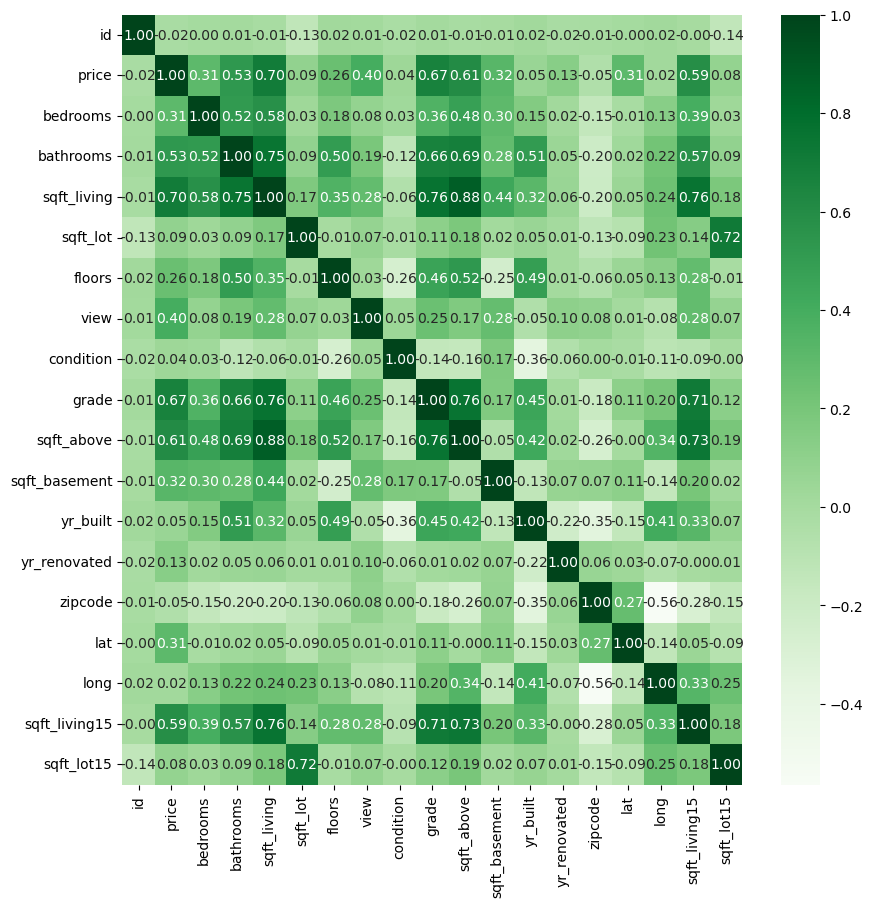

In [126]:
plt.figure(figsize=(10,10))
sns.heatmap(doma.corr(), annot=True, cmap="Greens", fmt='.2f');

Выделим только столбец *price* и отсортируем данные, чтобы детальнее рассмотреть влияние различных параметров именно на цену:

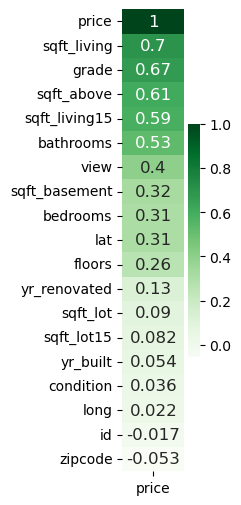

In [127]:
plt.figure(figsize=(1,6))
sns.heatmap(doma.corr()[['price']].sort_values(by='price', ascending=False), cmap="Greens", 
            annot=True, annot_kws={'size':12});

Из данных выше, мы можем сказать, что **сильнее всего** цена зависит от жилой и общей площади дома, от рейтинга по шкале оценок,  а также от количества ванных комнат. На цену дома **практически не оказывает влияния** состояние дома и год постройки. **Слабое влияние** на цену домов имеют такие характеристики, как год капитального ремонта, количество этажей и количество спален.
Посмотрим, например, на зависимость цены дома от рейтинга по шкале оценок.

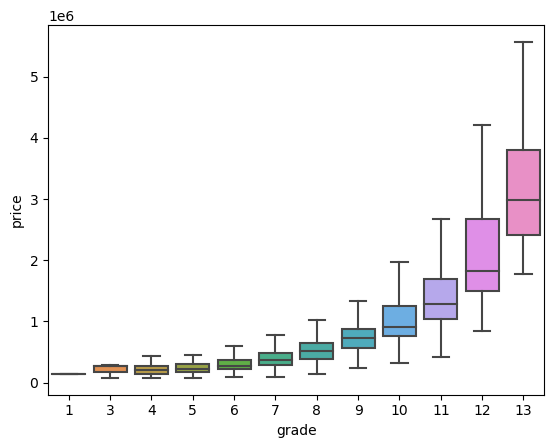

In [128]:
sns.boxplot(x=doma['grade'], y=doma['price'], showfliers=False);

Ну и для большей наглядности построим геоинформационную модель нашего датасета, т.к. он содержит геоданные lat для широты и long для долготы.  
Даже после глубокого анализа числовых данных остаются вопросы:

* Где эти места лежат на карте?
* Какие тенденции можно увидеть при картографировании?

Один из способов визуализации данных для ответа на эти вопросы — создание карт **folium** в Python.

In [129]:
import folium
import branca.colormap as cm

def get_center_latlong(df):
    centerlat = (df['lat'].max() + df['lat'].min()) / 2
    centerlong = (df['long'].max() + df['long'].min()) / 2
    return centerlat, centerlong

colormap = cm.LinearColormap(colors=['green', 'yellow', 'red'], vmin=100000, vmax=1500000)

center = get_center_latlong(doma)

m = folium.Map(location=center, zoom_start=10)

for i in range(len(doma)):
    folium.Circle(
        location=[doma.iloc[i]['lat'], doma.iloc[i]['long']],
        radius=10,
        fill=True,
        color=colormap(doma.iloc[i]['price']),
        fill_opacity=0.2
    ).add_to(m)

m.add_child(colormap)

# Сохранение карты
# m.save('price_colormap.html')

Вот еще что. В нашем датасете есть почтовые индексы. Посмотрим, как связана стоимость домов с ними.

In [130]:
center = get_center_latlong(doma)

m = folium.Map(location=center, zoom_start=10)

colormap = ['#00009B' ,'#0099FF' ,'#63FF9B' ,'#FFFB00' ,'#FF2F00' , '#8B0000']
maxave = int(doma.groupby(['zipcode']).mean()['price'].max())
print("Самая высокая цена на жилье в датасете составляет: ", maxave)

for index, row in doma.groupby('zipcode').agg({'lat': 'mean','long': 'mean', 'price':'mean', 'zipcode':'count' }).iterrows():     

    theCol = colormap[ int((len(colormap) - 1 ) *  float( row['price']) / maxave) ]
    markerText =  ( 'Средняя цена : ' + str(round(row['price'], 2) ) +' $' + '\n' + 'Кол-во продаваемых домов : ' + str(row['zipcode']) )
    folium.CircleMarker( radius=(row['zipcode'])/15, location=[row['lat'],row['long']], popup=folium.Popup(markerText,max_width=150,min_width=150), color= theCol,fill=True,fill_color=theCol,  ).add_to(m)

m

Самая высокая цена на жилье в датасете составляет:  2160606


#### Всё!